#Início


In [1]:
import pandas as pd
import string
import spacy
import collections

from collections import Counter
import nltk
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
import seaborn as sns

In [2]:
# Load the spaCy language model for English
nlp_en = spacy.load("en_core_web_sm")

In [3]:
!python -m spacy download pt_core_news_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 3.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [4]:
# Load the Portuguese language model
# https://spacy.io/models/pt
nlp = spacy.load('pt_core_news_lg')

#Dados

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
comments_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/IC/Trabalho-webmidia/csv/grupos_discordancia.csv')

In [7]:
import re
import html
def pre_processamento (x):

  retorno = re.sub(r'http(s)?://\S+|www\.\S+', '', x)
  verdadeiro = re.search(r'&\S+', retorno)

  if verdadeiro:
        retorno = html.unescape(retorno)

  return retorno

comments_df.loc[:, 'Comentário'] = comments_df.loc[:, 'Comentário'].apply(lambda x: pre_processamento(x))

In [8]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]

ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

#Nuvem *retirando* as Stop-words

##Retirar stop_words

In [9]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [10]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [11]:
english_stop_words = set(stopwords.words("english"))

In [12]:
stop_words = list(
    set(stopwords.words('portuguese')).union(set(nlp.Defaults.stop_words))
)

In [13]:
stop_words = list(set(stop_words).union(set(english_stop_words)))

In [14]:
stop_words.append('que')
stop_words.append('pra')
stop_words.append('o')
stop_words.append('eu')
stop_words.append('voce')
stop_words.append('você')
stop_words.append('vc')
stop_words.append('q')
stop_words.append('pq')
stop_words.append('n')
stop_words.append('ta')
stop_words.append('tá')
stop_words.append('pro')
stop_words.append('acho')
stop_words.append('2')
stop_words.append('nao')
stop_words.append('kkk')
stop_words.append('kkkk')
stop_words.append('kkkkk')
stop_words.append('kkkkkk')
stop_words.append('100')
stop_words.append('cara')
stop_words.append('achar')
stop_words.append('falar')
stop_words.append('pessoa')

In [15]:
!pip install emoji==1.7.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171033 sha256=4072458ef787487f0e42315cba05f3ac7caeada20d6fe6712bdf452525f91612
  Stored in directory: /root/.cache/pip/wheels/31/8a/8c/315c9e5d7773f74b33d5ed33f075b49c6eaeb7cedbb86e2cf8
Successfully built emoji


In [16]:
import re
import emoji
from dateutil.parser import parse

In [17]:
def clean_comment_v2(comment):
    # Replace links

    comment = re.sub(r'http\S+', '<URL>', comment)

    # Replace mentions and usernames with 'MENTION'
    ccomment = re.sub(r'@\w+', '<MENTION>', comment)

    # comment = re.sub(r'\b\d+\b', '<NUMBER>', comment)

    # Replace hashtags with 'HASHTAG'
    comment = re.sub(r'#(\w+)', r'<HASHTAG>', comment)

    # Replace emojis with 'EMOJI'
    comment = ''.join(['<EMOJI>' if c in emoji.UNICODE_EMOJI['en'] else c for c in comment])

    # Replace quoted text with 'QUOTED_TEXT'
    comment = re.sub(r'^\s*>[^\n]*', r'<QUOTED_TEXT>', comment, flags=re.MULTILINE)

    # Replace references to time and dates with 'DATE'
    date_mentions = re.findall(r'\b\d{1,2}[\-\/]\d{1,2}[\-\/]\d{2,4}\b', comment)
    for date in date_mentions:
        parsed_date = str(parse(date).date())
        comment = comment.replace(date, '<DATE>')

    # Remove laughter expressions like "kkkk" and "haha"
    comment = re.sub(r'\b(kk+)\b', '', comment, flags=re.IGNORECASE)
    comment = re.sub(r'\b(ha+h[ha]*)\b', '', comment, flags=re.IGNORECASE)

    doc = nlp(comment)

    cleaned_tokens = []
    last_token = None

    for token in doc:
        if token.is_alpha and token.text.lower() not in stop_words:
            # Remove repeated symbols
            if last_token is None or token.text != last_token:
                # cleaned_tokens.append(token.text.lower())
                cleaned_tokens.append(token.text.lower().strip())
            last_token = token.text

    cleaned_comment = " ".join(cleaned_tokens)

    return cleaned_comment

In [18]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

##Retirar stop_words(customizado)


In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
english_stop_words = set(stopwords.words("english"))

In [ ]:
stop_words = list(
    set(stopwords.words('portuguese')).union(set(nlp.Defaults.stop_words))
)

In [ ]:
stop_words = list(
    set(stopwords.words('portuguese')).union(set(nlp.Defaults.stop_words))
)

In [ ]:
stop_words = list(set(stop_words).union(set(english_stop_words)))

In [ ]:
stop_words.append('que')
stop_words.append('pra')
stop_words.append('o')
stop_words.append('eu')
stop_words.append('voce')
stop_words.append('você')
stop_words.append('vc')
stop_words.append('q')
stop_words.append('pq')
stop_words.append('ta')
stop_words.append('tá')
stop_words.append('pro')
stop_words.append('acho')
stop_words.append('2')
stop_words.append('kkk')
stop_words.append('kkkk')
stop_words.append('kkkkk')
stop_words.append('kkkkkk')
stop_words.append('100')
stop_words.append('cara')
stop_words.append('achar')
stop_words.append('falar')
stop_words.append('pessoa')

stop_words.append('vc')  # você
stop_words.append('tb')  # também
stop_words.append('tbm')  # também
stop_words.append('blz')  # beleza
stop_words.append('pq')  # porque/por quê
stop_words.append('q')  # que
stop_words.append('qlq')  # qualquer
stop_words.append('td')  # tudo
stop_words.append('n')  # não
stop_words.append('nd')  # nada
stop_words.append('cmg')  # comigo
stop_words.append('dps')  # depois
stop_words.append('aki')  # aqui
stop_words.append('mt')  # muito
stop_words.append('hj')  # hoje
stop_words.append('vlw')  # valeu
stop_words.append('blz')  # beleza
stop_words.append('flw')  # falou
stop_words.append('dj')  # disc jockey (DJ)
stop_words.append('tá')  # está
stop_words.append('to')  # estou
stop_words.append('eh')  # é
stop_words.append('kd')  # cadê
stop_words.append('td')  # tudo
stop_words.append('aki')  # aqui
stop_words.append('né')  # não é
stop_words.append('ja')  # já
stop_words.append('aí')  # ali

In [ ]:
stop_words_negativas = [
    "não", "nada", "nenhum", "nem", "nunca", "jamais", "impossível", "pior", "péssimo", "horrível",
    "odiar", "detesto", "odeio", "problema", "problemas", "infelizmente", "lamentável", "chato",
    "cansativo", "perda", "falha", "erro", "errado", "desastroso", "absurdo", "insatisfeito",
    "insatisfação", "decepcionante", "decepção", "fraco", "ruim", "péssima", "dificuldade",
    "difícil", "sem sentido", "frustrante", "complicado", "desorganizado", "desleixo",
    "insuficiente", "negativo", "falta", "desagrado", "desagradar", "tristeza", "cansado",
    "incomodado", "inconveniente", "insuportável", "ignorar", "desprezo", "reprovável",
    "vergonhoso", "sujo", "problemático", "dispensável", "irritante", "inadequado", "abandono",
    "medíocre", "negligência", "inútil", "insensível", "desatento", "revoltante", "baixo nível",
    "desvantagem", "superficial", "insatisfatório", "descaso", "omisso", "péssima experiência",
    "desapontado", "sem resposta", "injustiça", "infeliz", "inaceitável", "falhou", "horrorizado",
    "frustrado", "perda de tempo", "sem valor", "nada bom", "ineficaz", "sem noção", "ignorante",
    "impraticável", "sem lógica", "mal feito", "absurdo", "sem educação", "irritado",
    "insuportável", "sem resultado", "desmotivador", "decepcionado", "má qualidade", "não compensa",
    "improdutivo", "insuficiente", "contra", "menos", "menor", "nenhuma", "somente", "mal",
    "embora", "porém", "todavia", "entretanto", "apenas", "último", "pouco", "longe", "único",
    "limitado", "restrito", "dificilmente", "escasso", "exclusivo", "inviável", "inalcançável",
    "deficiente", "inadequado", "irrelevante", "anterior", "inferior", "indisponível", "proibido",
    "restrição", "exceto", "unicamente", "falso", "baixo", "não", "nada", "nenhum", "nem", "nunca", "jamais", "impossível",
    "pior", "péssimo", "horrível", "detesto", "odeio", "lamentável",
    "infelizmente", "chato", "insuportável", "ruim", "fraco",
    "complicado", "inadequado", "indesejado", "insuportável",
    "prejudicial", "desagradável", "dificuldade", "difícil", "problema",
    "falha", "erro", "enganado", "fracasso", "cansativo", "desastre",
    "negligente", "baixo", "perda", "injusto", "sem sentido",
    "perigoso", "irresponsável", "falso", "tóxico", "desprezível",
    "preconceituoso", "ridículo", "vergonhoso", "inaceitável",
    "falta", "incompleto", "inadequado", "inadmissível", "incorreto",
    "desleixado", "defeituoso", "limitado", "restrito", "superficial",
    "inviável", "desapontado", "excessivo", "ineficaz", "inferior",
    "incapaz", "insuficiente", "decepcionante", "desanimado",
    "preocupante", "desproporcional", "inútil", "problemático",
    "frustrante", "improdutivo", "pouco", "omisso", "ignorante",
    "medíocre", "prepotente", "final", "fora"
]


In [ ]:
len(stop_words)

723

In [ ]:
stop_words = [x for x in stop_words if x not in stop_words_negativas]

In [ ]:
len(stop_words)

703

In [ ]:
!pip install emoji==1.7.0

In [ ]:
import re
import emoji
from dateutil.parser import parse

In [ ]:
def clean_comment_v2(comment):
    # Replace links

    comment = re.sub(r'http\S+', '<URL>', comment)

    # Replace mentions and usernames with 'MENTION'
    ccomment = re.sub(r'@\w+', '<MENTION>', comment)

    # comment = re.sub(r'\b\d+\b', '<NUMBER>', comment)

    # Replace hashtags with 'HASHTAG'
    comment = re.sub(r'#(\w+)', r'<HASHTAG>', comment)

    # Replace emojis with 'EMOJI'
    comment = ''.join(['<EMOJI>' if c in emoji.UNICODE_EMOJI['en'] else c for c in comment])

    # Replace quoted text with 'QUOTED_TEXT'
    comment = re.sub(r'^\s*>[^\n]*', r'<QUOTED_TEXT>', comment, flags=re.MULTILINE)

    # Replace references to time and dates with 'DATE'
    date_mentions = re.findall(r'\b\d{1,2}[\-\/]\d{1,2}[\-\/]\d{2,4}\b', comment)
    for date in date_mentions:
        parsed_date = str(parse(date).date())
        comment = comment.replace(date, '<DATE>')

    # Remove laughter expressions like "kkkk" and "haha"
    comment = re.sub(r'\b(kk+)\b', '', comment, flags=re.IGNORECASE)
    comment = re.sub(r'\b(ha+h[ha]*)\b', '', comment, flags=re.IGNORECASE)

    doc = nlp(comment)

    cleaned_tokens = []
    last_token = None

    for token in doc:
        if token.is_alpha and token.text.lower() not in stop_words:
            # Remove repeated symbols
            if last_token is None or token.text != last_token:
                # cleaned_tokens.append(token.text.lower())
                cleaned_tokens.append(token.text.lower().strip())
            last_token = token.text

    cleaned_comment = " ".join(cleaned_tokens)

    return cleaned_comment

In [ ]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

#Nuvens

In [23]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [24]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

In [25]:
textos_neu = [nltk.word_tokenize(str(x).lower()) for x in neutro_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_neg = [nltk.word_tokenize(str(x).lower()) for x in negativo_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_pos = [nltk.word_tokenize(str(x).lower()) for x in positivo_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_nsei = [nltk.word_tokenize(str(x).lower()) for x in ns_comments.loc[:, 'cleaned_comment_v2'].tolist()]
textos_dis = [nltk.word_tokenize(str(x).lower()) for x in dis_comments.loc[:, 'cleaned_comment_v2'].tolist()]

In [26]:
def concatenar_listas(grupo_listas):
  lista_final = []

  for l in grupo_listas:
    lista_final = lista_final + l

  return lista_final

In [27]:
palavras_neu = concatenar_listas(textos_neu)
palavras_neg = concatenar_listas(textos_neg)
palavras_pos = concatenar_listas(textos_pos)
palavras_nsei = concatenar_listas(textos_nsei)
palavras_dis = concatenar_listas(textos_dis)

In [28]:
lista_palavroes = [
    "merda", "puta", "foda", "porra", "fdp", "caralho", "buceta", "cu",
    "boquete", "putz", "burro", "pau", "imbecis", "idiota", "desgraça",
    "babaca", "otário", "cretino", "vagabundo", "merdinha", "bosta",
    "cagado", "miserável", "nojento", "escroto", "jumento", "canalha",
    "arrombado", "pilantra", "trapaceiro", "palhaço", "animal",
    "bobalhão", "cuzão", "mané", "lixo", "escória", "patético", "ridículo",
    "paspalho", "molóide", "verme", "anta", "energúmeno", "estúpido", "retardado", "moleque", "vacilão", "merdoso", "corno",
    "panaca", "trouxa", "macaco", "cabeçudo", "otária", "piranha",
    "corrupto", "tarado", "filhadaputa", "merdalhão", "escumalha",
    "safado", "traíra", "fajuto", "vaca", "sanguessuga",
    "bocó", "cretina", "corna", "babaca", "abestado", "encosto", "peste", "mijar", "ferrar", "ferrem", "foder", "fudido", "esculacho", "vagabunda", "parasita", "cretinice", "medíocre",
    "asno", "burra", "infeliz", "bostinha", "larápio", "cafajeste",
    "otarice", "peidorreiro", "fedelho", "zé-ruela", "ralé", "fubá",
    "naba", "bocudo", "insolente", "ridícula", "inútil", "trapaceira",
    "desmiolado", "sem-vergonha", "tralha", "lambão", "burrice",
    "vigarista", "trapaceiro", "rançoso", "matuto", "cretinagem",
    "desastrado", "paspalho", "chato", "carniça", "folgado",
    "esfarrapado", "chifrudo", "mau-caráter", "ladra", "porcaria",  "Aabafa-a-palhinha", "abécula", "abelhudo", "abichanado", "abutre", "agarrado", "agiota", "agressivo", "alarve",
    "alcouceira", "alcoviteira", "aldrabão", "aleivoso", "amalucado", "amarelo", "amaneirado", "amaricado",
    "analfabeto", "analfabruto", "animal", "anjinho", "anormal", "apóstata", "arrelampado", "arrogante",
    "artolas", "arruaceiro", "aselha", "asno", "asqueroso", "assassino", "atrasado", "avarento", "avaro",
    "aventesma", "azeiteiro", "bacoco", "bácoro", "badalhoca", "badameco", "baixote", "bajulador", "baldas",
    "baleia", "balhelhas", "balofo", "banana", "bandalho", "bandido", "bárbaro", "bardajona", "bardamerdas",
    "bargante", "barrigudo", "basbaque", "basculho", "básico", "bastardo", "batoque", "batoteiro", "beata",
    "bebedanas", "bêbedo", "bebedolas", "beberrão", "besta", "betinho", "bexigoso", "bichona", "biltre",
    "bimbo", "bisbilhoteira", "boateiro", "bobo", "boçal", "bode", "bófia", "boi", "borracho", "bronco",
    "brutamontes", "bruto", "bruxa", "bufo", "burgesso", "burlão", "burro", "cabeçudo", "cabotino", "cabrona",
    "cábula", "caceteiro", "cachorro", "cacique", "caco", "cadela", "cagão", "caguinchas", "calaceiro",
    "calão", "calhordas", "calinas", "caloteiro", "camafeu", "camelo", "campónio", "canalha", "canastrão",
    "cão", "caquética", "caramelo", "careca", "careta", "carniceiro", "carraça", "carrancudo", "carroceiro",
    "casmurro", "cegueta", "celérado", "cepo", "chalado", "chanfrado", "charlatão", "chato", "chauvinista",
    "chibo", "choné", "choninhas", "choramingas", "chulo", "chunga", "chupista", "cínico", "cobarde",
    "coirão", "comuna", "convencido", "corcunda", "corrupto", "coxinha", "crápula", "cretino", "cromo",
    "cromaço", "criminoso", "cunanas", "cusca", "debochado", "delambida", "delinquente", "demagogo", "demente",
    "demónio", "depravado", "desajeitado", "desastrado", "desavergonhada", "desbocado", "desbragado",
    "descabelada", "desdentado", "desengonçado", "desgraçado", "deshumano", "deslavado", "desleal",
    "desmazelada", "desmiolado", "desonesto", "despistado", "déspota", "destrambelhado", "destrava", "desvairado",
    "devasso", "diabo", "ditador", "doidivanas", "doido", "dondoca", "drogado", "egoísta", "embirrento",
    "embusteiro", "emplastro", "energúmeno", "enfadonho", "enfezado", "engraxador", "enjoado", "enrabador",
    "escaldante", "escroque", "escumalha", "esgalgado", "esganiçada", "esgroviada", "esguedelhado",
    "espalhafatoso", "espantalho", "esqueleto", "esquerdista", "estafermo", "estapafúrdio", "estouvado",
    "estroina", "estropício", "estulto", "estúpido", "estupor", "faccioso", "facínora", "fala-barato",
    "falsário", "fanático", "fanchono", "fanfarrão", "fariseu", "farrapo", "farsante",
    "fatela", "fedelho", "fiteiro", "foção", "fodido", "fodilhona", "foleiro", "forreta", "fraco",
    "franganote", "frangueiro", "frasco", "frígida", "frívolo", "frouxo", "fuinha", "furista", "gabarola",
    "galinha", "ganancioso", "gandim", "gatuno", "gazeteiro", "glutão", "gordalhufo", "gordo", "gosma",
    "gralha", "grosseiro", "grotesco", "grunho", "guedelhudo", "herege", "hipócrita", "histérica",
    "idiota", "ignorante", "imaturo", "imbecil", "impertinente", "impostor", "incapaz", "incompetente",
    "indecente", "indigente", "indolente", "inepto", "infame", "infeliz", "infiel", "imprudente",
    "intriguista", "invejoso", "insensível", "insignificante", "insípido", "intolerante", "irritante",
    "javardo", "judeu", "labrego", "labroste", "lacaio", "ladrão", "lambão", "lambareiro", "lambe-botas",
    "lambisgóia", "lamechas", "laranja", "larápio", "larilas", "lavajão", "lerdo", "lesma", "libertino",
    "limitado", "lingrinhas", "lontra", "lorpa", "louco", "lunático", "madraço", "mafioso", "maganão",
    "magricela", "malcriado", "malandreco", "malfeitor", "maltrapilho", "malvado", "mamalhuda", "mandrião",
    "maneta", "mangas-de-alpaca", "manhoso", "maniaco", "marado", "marmanja", "masoquista", "matrafona",
    "medíocre", "meliante", "megera", "meliante", "mentecapto", "mentiroso", "merdas", "mesquinho",
    "metediço", "mijão", "milagreiro", "miserável", "moinante", "molengão", "mongo", "mongol",
    "monstro", "mórbido", "morraça", "mosca", "mosqueteiro", "mouco", "mula", "múmia", "nababo", "nabo",
    "narcisista", "narizudo", "naúfrago", "nazi", "necrófilo", "néscio", "nhonhó", "nojento", "nulidade",
    "obcecado", "obnóxio", "obstinado", "obtuso", "onanista", "oportunista", "ordinário", "orelhas",
    "otário", "pacóvio", "padreca", "palerma", "palhaço", "palonço", "panasca", "paneleiro",
    "paranoico", "parasita", "parvalhão", "parvo", "pasmarote", "paspalho", "patareco", "patego",
    "patife", "patinhas", "pedante", "pedinchas", "pega", "pelintra", "pendura", "peneirento",
    "perigoso", "petulante", "picuinhas", "pimba", "piolho", "pirata", "pitosga", "pobre", "pobretanas",
    "poltrão", "porco", "posudo", "pouca-vergonha", "praguento", "preguiçoso", "presunçoso", "puxa-saco",
    "quasimodo", "racista", "rapace", "ratão", "ratazana", "relapso", "ressabiado", "retardado",
    "retrógrado", "ridículo", "roto", "ruim", "sacana", "safado", "saloio", "sanguessuga", "saracoteiro",
    "sarnento", "sebento", "sem-vergonha", "servil", "simiesco", "simplório", "sinistro", "sofista",
    "sonso", "sovina", "tagarela", "tarado", "tartaruga", "tarzan", "teimoso", "tentador", "terceiro-mundista",
    "toleirão", "tosco", "tosga", "trambiqueiro", "traidor", "tralho", "trapaceiro", "traste",
    "tretas", "troca-tintas", "trombudas", "trompa", "tropeiro", "trottoir", "tuga", "umbiguista",
    "usurpador", "vaidoso", "vampiro", "vândalo", "vazio", "vermes", "verme", "verminho", "vicejador",
    "vil", "violador", "vira-latas", "voadeiro", "vulgar", "zangão", "zé-ninguém", "zeco", "zelador",
    "zombeteiro", "zumba", "viado", "chupa", "sentar",  "Boquete", "Foda", "Foda-se", "Foder", "fodendo", "pau",
    "pica", "porra", "pariu", "punheta",
    "trepar","buceta", "xoxota", "sacanagem",
    "cacete", "caceta", "siririca", "arrombado", "babaca", "brocha", "bicha", "boiola",
    "cracudo", "galinha", "puta", "piranha", "vagabundo", "viado",
    "chupar", "foder", "corno",
    "fodido", "cachorro", "cachorra", "canalha", "escroto", "escrota", "trouxa", "vaca",
    "égua", "cagar",
    "rola",
    "cagado", "mijar", "cagar", "peido", "saco", "coco"
]



In [29]:
def ocultar(x):
  if len(x) < 6:
    return x[:-1] + "*"
  else:
    return x[:-2] + "**"


In [30]:
palavras_neu = [ocultar(x) if x in lista_palavroes else x for x in palavras_neu]
palavras_neg = [ocultar(x) if x in lista_palavroes else x for x in palavras_neg]
palavras_pos = [ocultar(x) if x in lista_palavroes else x for x in palavras_pos]
palavras_nsei = [ocultar(x) if x in lista_palavroes else x for x in palavras_nsei]
palavras_dis = [ocultar(x) if x in lista_palavroes else x for x in palavras_dis]

In [31]:
def contar_palavras(texto):

  count_words = Counter()

  for palavra in texto:
    count_words[palavra] += 1

  return count_words

In [32]:
count_words_neu = contar_palavras(palavras_neu)
count_words_neg = contar_palavras(palavras_neg)
count_words_pos = contar_palavras(palavras_pos)
count_words_ns = contar_palavras(palavras_nsei)
count_words_dis = contar_palavras(palavras_dis)

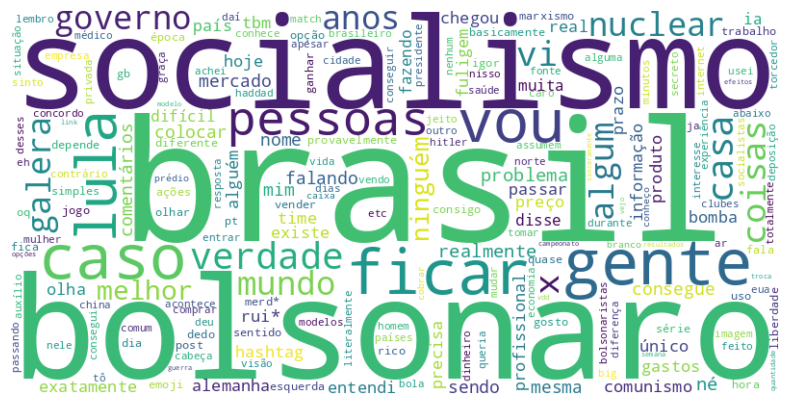

In [33]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



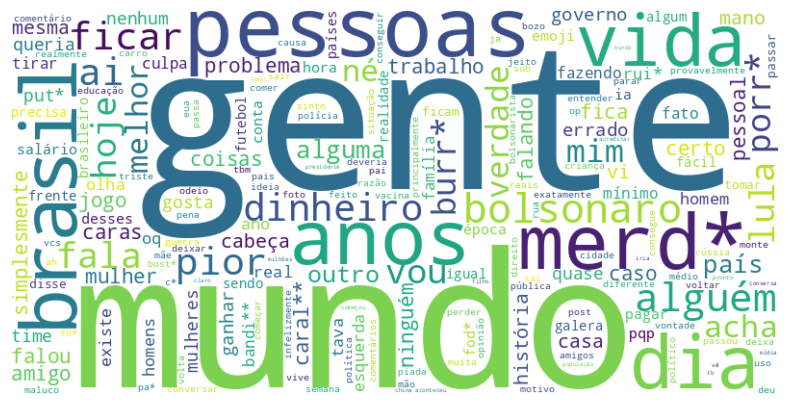

In [34]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

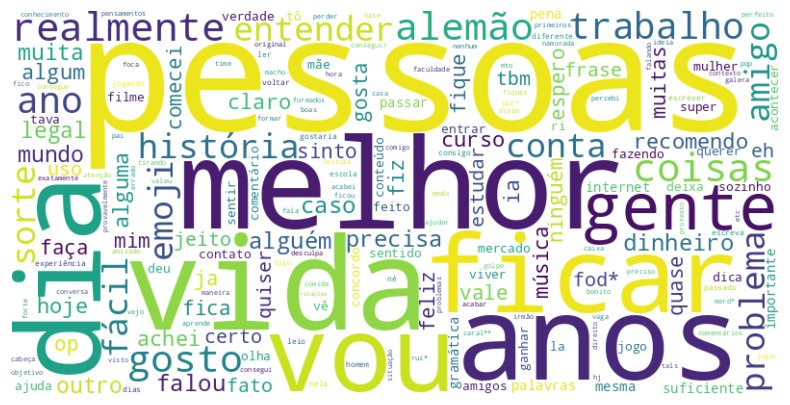

In [35]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_pos))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

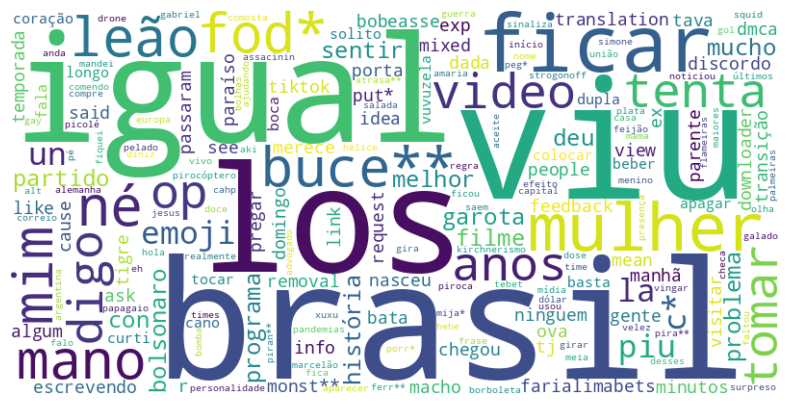

In [36]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()




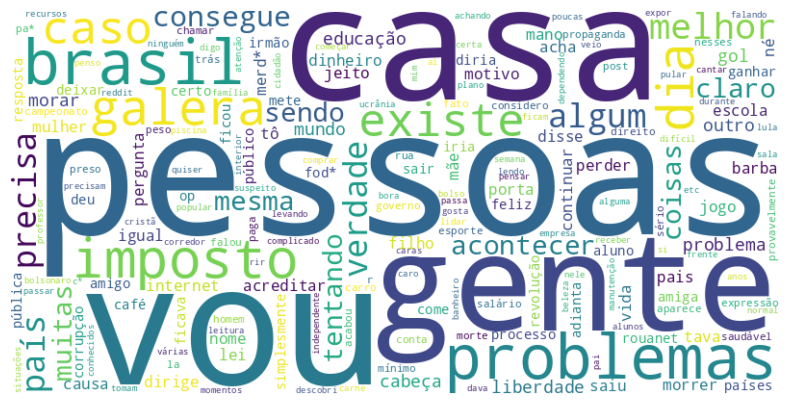

In [37]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(count_words_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**bold text**#Nuvem palavras exclusivas(Levando em conta os comentários Não sei dizer)


In [38]:
palavras_pos_neg_ns = set(palavras_pos + palavras_neg + palavras_nsei + palavras_dis) #neutro
palavras_pos_neu_ns = set(palavras_pos + palavras_neu + palavras_nsei + palavras_dis) #negativo
palavras_neg_neu_ns = set(palavras_neg + palavras_neu + palavras_nsei + palavras_dis) #positivo
palavras_pos_neu_neg = set(palavras_pos + palavras_neu + palavras_neg + palavras_dis) #não sei dizer
palavras_para_dis = set(palavras_pos + palavras_neu + palavras_neg + palavras_nsei) #discordância total

In [39]:
len(palavras_para_dis)

8514

In [40]:
exlusivas_neu = [p for p in palavras_neu if p not in palavras_pos_neg_ns]
exlusivas_neg = [p for p in palavras_neg if p not in palavras_pos_neu_ns]
exlusivas_pos = [p for p in palavras_pos if p not in palavras_neg_neu_ns]
exlusivas_ns = [p for p in palavras_nsei if p not in palavras_pos_neu_neg]
exlusivas_dis = [p for p in palavras_dis if p not in palavras_para_dis]

In [41]:
len(exlusivas_neu), len(exlusivas_neg), len(exlusivas_pos), len(exlusivas_ns), len(exlusivas_dis)

(1463, 4465, 1247, 164, 615)

In [42]:
exclusivas_counter_neu = contar_palavras(exlusivas_neu)
exclusivas_counter_neg = contar_palavras(exlusivas_neg)
exclusivas_counter_pos = contar_palavras(exlusivas_pos)
exclusivas_counter_ns = contar_palavras(exlusivas_ns)
exclusivas_counter_dis = contar_palavras(exlusivas_dis)

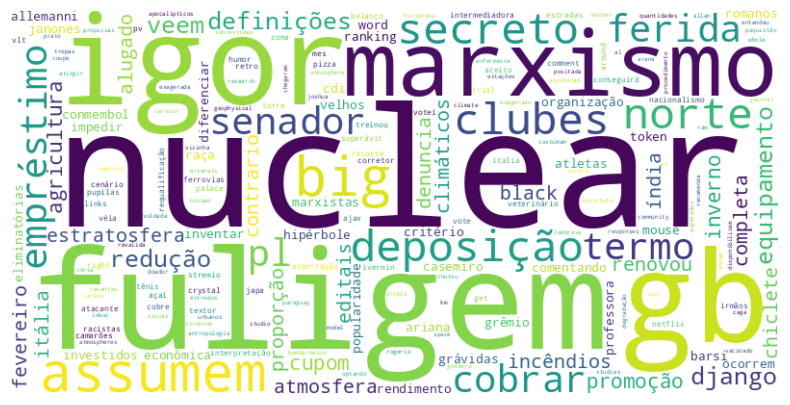

In [43]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivas_counter_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

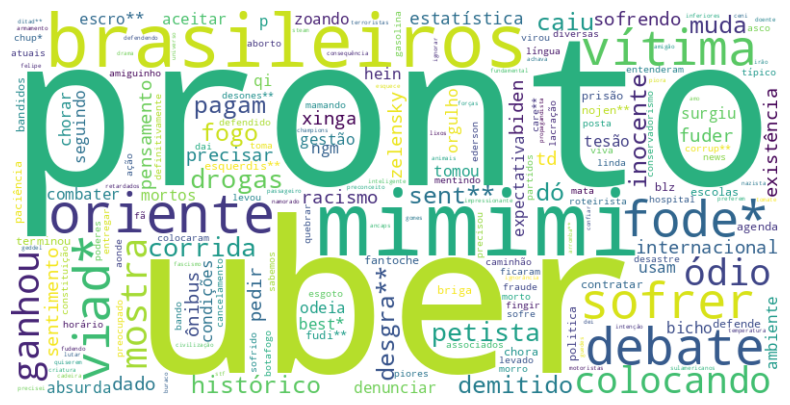

In [44]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivas_counter_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



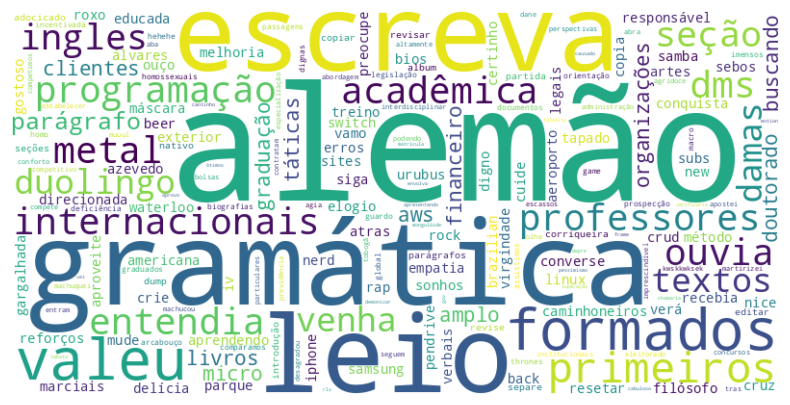

In [45]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivas_counter_pos))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

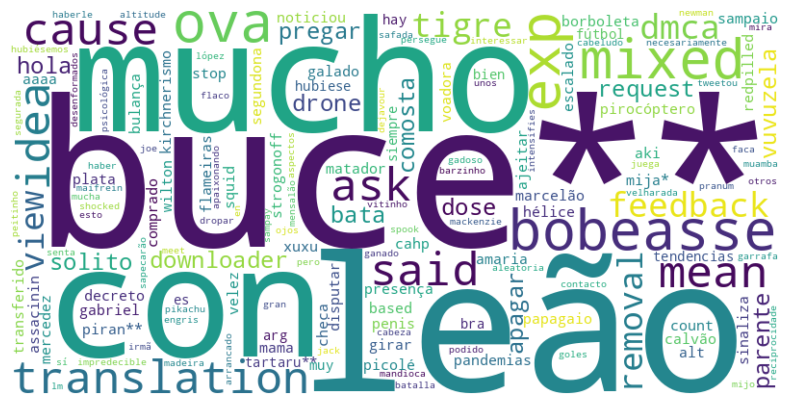

In [46]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivas_counter_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

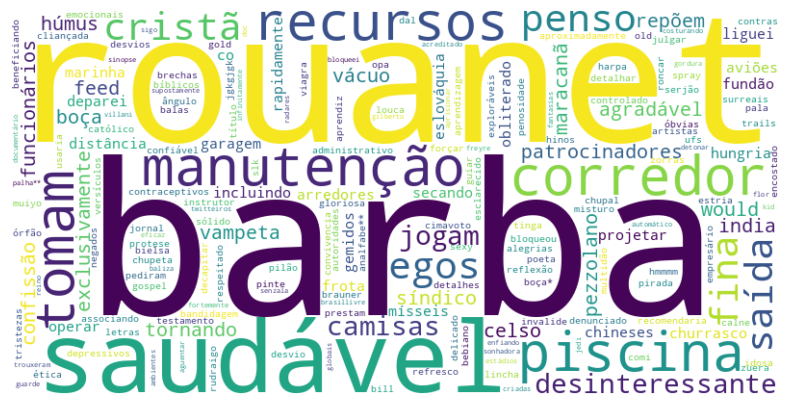

In [47]:
#discordância totoal
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(exclusivas_counter_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#Nuvem n-gramas(N irei retirar as stop_words)

In [48]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]


ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

In [49]:
def ocultar_em_frase(text, lista_proibidos):

  texto_final = []

  for idx, p in enumerate(nltk.word_tokenize(text.lower())):
    if len(p) < 6 and p in lista_proibidos:
      p = p[:-1] + "*"
    elif p in lista_proibidos:
      p = p[:-2] + "**"


    texto_final.append(p)


  return texto_final

In [50]:
lista_neu = neutro_comments['Comentário'].tolist()
lista_neg = negativo_comments['Comentário'].tolist()
lista_pos = positivo_comments['Comentário'].tolist()
lista_ns = ns_comments['Comentário'].tolist()
lista_dis = dis_comments['Comentário'].tolist()

In [51]:
def extract_ngrams(comment_list, n):
    all_ngrams = []
    for comment in comment_list:
        tokens = ocultar_em_frase(comment.lower(), lista_palavroes)
        ngrams_list = list(nltk.ngrams(tokens, n))
        all_ngrams.extend(ngrams_list)
    return all_ngrams

##2-gramas

In [52]:
neu_ngrams = extract_ngrams(lista_neu, 2)
neg_ngrams = extract_ngrams(lista_neg, 2)
pos_ngrams = extract_ngrams(lista_pos, 2)
ns_ngrams = extract_ngrams(lista_ns, 2)
dis_ngrams = extract_ngrams(lista_dis, 2)

In [53]:
neu_ngram_freq = Counter(neu_ngrams)
neg_ngram_freq = Counter(neg_ngrams)
pos_ngram_freq = Counter(pos_ngrams)
ns_ngram_freq = Counter(ns_ngrams)
dis_ngram_freq = Counter(dis_ngrams)

In [54]:
def converter_texto(counter_tipo):
    dic = {}
    lista_pontuacao = ['!','.', ',', ':', '>', '<', "'", '"', "%", "$", "@", "*", "?", "/", "+", "-", "(", ")", "()", "|", ";", "{}", "^", "~", "´", "`", "{", "}", "[", "]", "[]", "#", "&"]

    for key, value in counter_tipo.items():
      if key[0] not in lista_pontuacao and key[1] not in lista_pontuacao:
        dic[f'{key[0]} {key[1]}'] = value
    return dic

In [55]:
neu_ngram_freq = converter_texto(neu_ngram_freq)
neg_ngram_freq = converter_texto(neg_ngram_freq)
pos_ngram_freq = converter_texto(pos_ngram_freq)
ns_ngram_freq = converter_texto(ns_ngram_freq)
dis_ngram_freq = converter_texto(dis_ngram_freq)

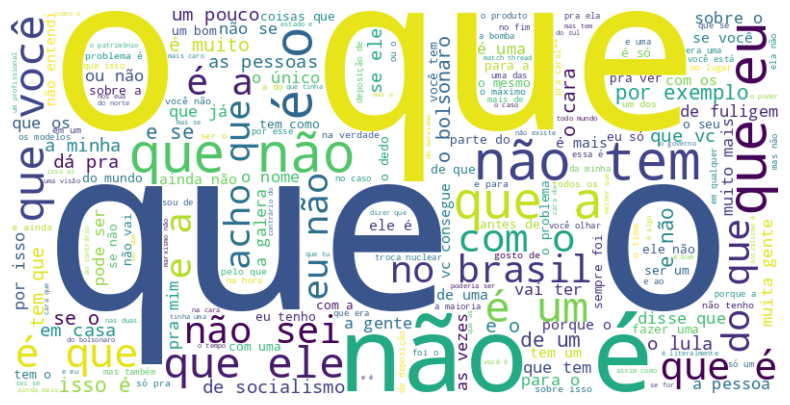

In [56]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neu_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

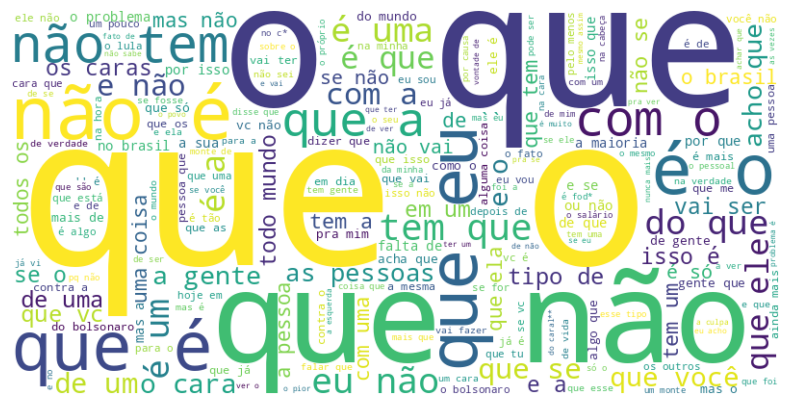

In [57]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neg_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

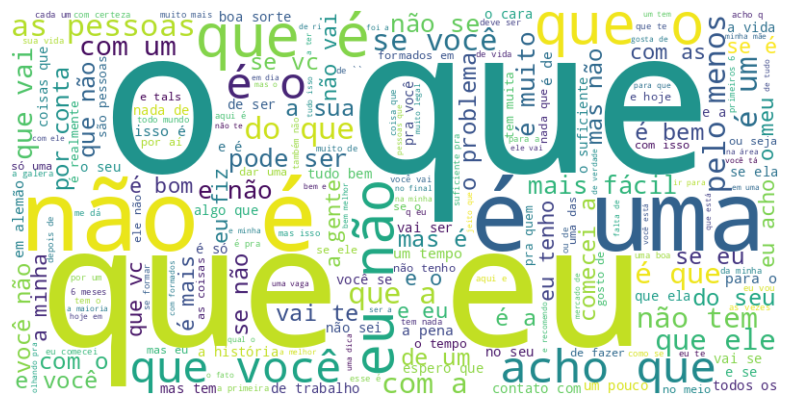

In [58]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(pos_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

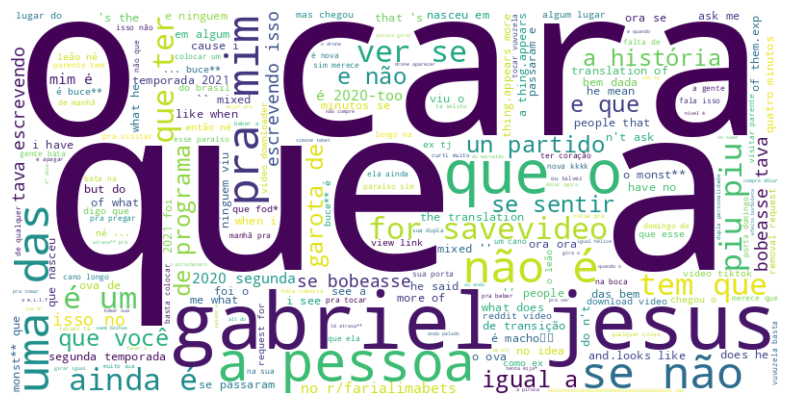

In [59]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(ns_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

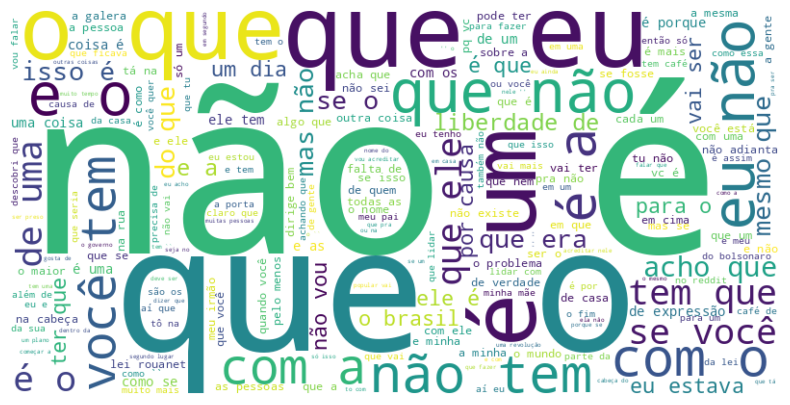

In [60]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(dis_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##3-gramas

In [61]:
neu_ngrams = extract_ngrams(lista_neu, 3)
neg_ngrams = extract_ngrams(lista_neg, 3)
pos_ngrams = extract_ngrams(lista_pos, 3)
ns_ngrams = extract_ngrams(lista_ns, 3)
dis_ngrams = extract_ngrams(lista_dis, 3)

In [62]:
neu_ngram_freq = Counter(neu_ngrams)
neg_ngram_freq = Counter(neg_ngrams)
pos_ngram_freq = Counter(pos_ngrams)
ns_ngram_freq = Counter(ns_ngrams)
dis_ngram_freq = Counter(dis_ngrams)

In [63]:
def converter_texto(counter_tipo):
    dic = {}
    lista_pontuacao = ['!','.', ',', ':', '>', '<', "'", '"', "%", "$", "@", r"*", "?", "/", "+", "-", "(", ")", "()", "|", ";", "{}", "^", "~", "´", "`", "{", "}", "[", "]", "[]", "#", "&"]

    for key, value in counter_tipo.items():
      if key[0] not in lista_pontuacao and key[1] not in lista_pontuacao and key[2] not in lista_pontuacao:
        dic[f'{key[0]} {key[1]} {key[2]}'] = value
    return dic

In [64]:
neu_ngram_freq = converter_texto(neu_ngram_freq)
neg_ngram_freq = converter_texto(neg_ngram_freq)
pos_ngram_freq = converter_texto(pos_ngram_freq)
ns_ngram_freq = converter_texto(ns_ngram_freq)
dis_ngram_freq = converter_texto(dis_ngram_freq)

(-0.5, 799.5, 399.5, -0.5)

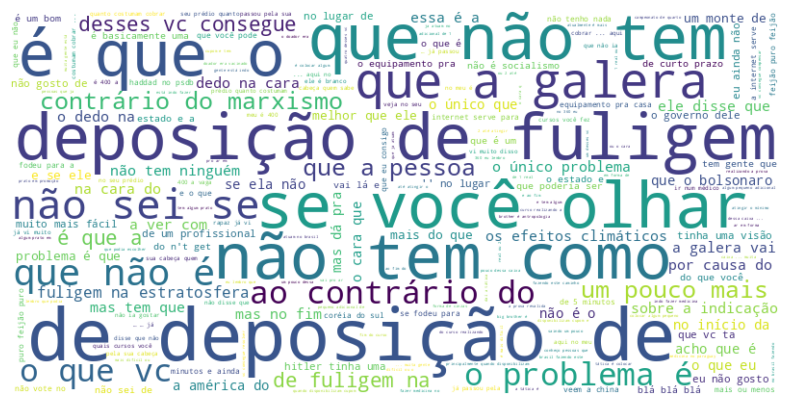

In [65]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neu_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

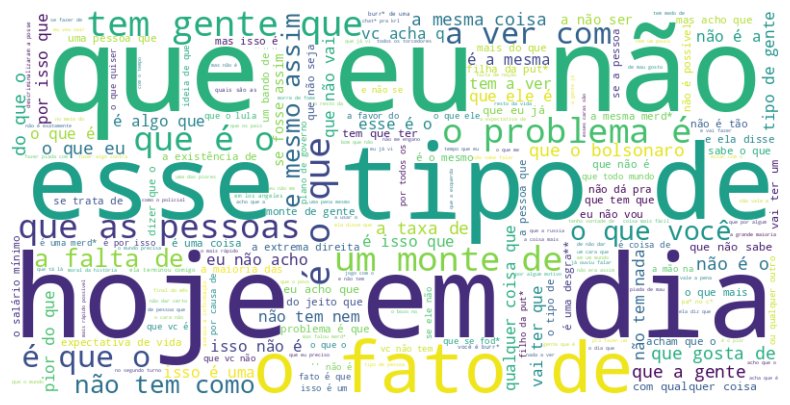

In [66]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neg_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

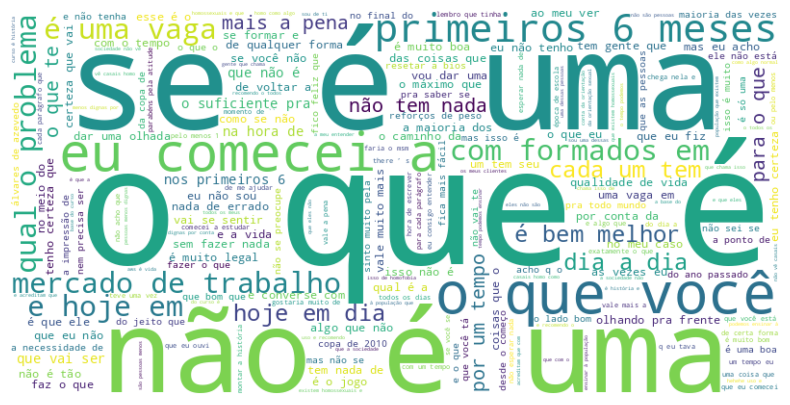

In [67]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(pos_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

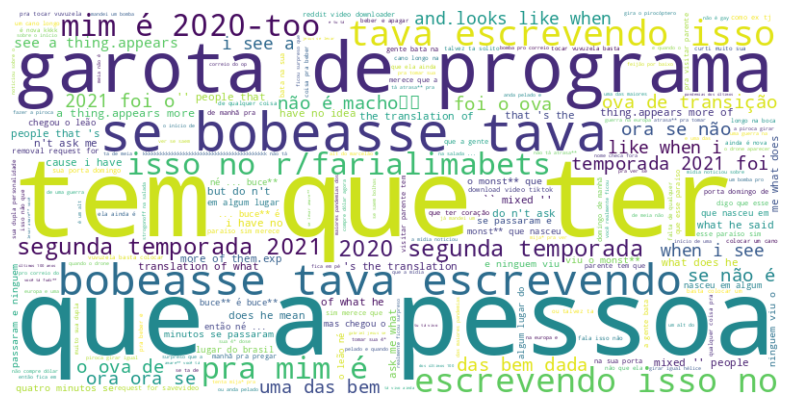

In [68]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(ns_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

(-0.5, 799.5, 399.5, -0.5)

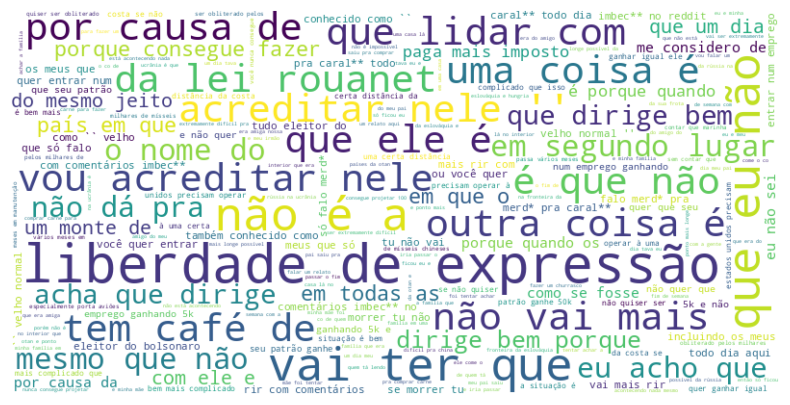

In [69]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(dis_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

#Nuvem 2-gramas(retirei as stop_words)

In [70]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]

ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

In [71]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

In [72]:
lista_neu = neutro_comments['cleaned_comment_v2'].tolist()
lista_neg = negativo_comments['cleaned_comment_v2'].tolist()
lista_pos = positivo_comments['cleaned_comment_v2'].tolist()
lista_ns = ns_comments['cleaned_comment_v2'].tolist()
lista_dis = dis_comments['cleaned_comment_v2'].tolist()

In [73]:
def extract_ngrams(comment_list, n):
    all_ngrams = []
    for comment in comment_list:
        tokens = ocultar_em_frase(comment.lower(), lista_palavroes)
        ngrams_list = list(nltk.ngrams(tokens, n))
        all_ngrams.extend(ngrams_list)
    return all_ngrams

In [74]:
neu_ngrams = extract_ngrams(lista_neu, 2)
neg_ngrams = extract_ngrams(lista_neg, 2)
pos_ngrams = extract_ngrams(lista_pos, 2)
ns_ngrams = extract_ngrams(lista_ns, 2)
dis_ngrams = extract_ngrams(lista_dis, 2)

In [75]:
neu_ngram_freq = Counter(neu_ngrams)
neg_ngram_freq = Counter(neg_ngrams)
pos_ngram_freq = Counter(pos_ngrams)
ns_ngram_freq = Counter(ns_ngrams)
dis_ngram_freq = Counter(dis_ngrams)

In [76]:
def converter_texto(counter_tipo):
    dic = {}
    lista_pontuacao = ['!','.', ',', ':', '>', '<', "'", '"', "%", "$", "@", r"\b*", "?", "/", "+", "-", "(", ")", "()", "|", ";", "{}", "^", "~", "´", "`", "{", "}", "[", "]", "[]", "#", "&"]

    for key, value in counter_tipo.items():
      if key[0] not in lista_pontuacao and key[1] not in lista_pontuacao:
        dic[f'{key[0]} {key[1]}'] = value
    return dic

In [77]:
neu_ngram_freq = converter_texto(neu_ngram_freq)
neg_ngram_freq = converter_texto(neg_ngram_freq)
pos_ngram_freq = converter_texto(pos_ngram_freq)
ns_ngram_freq = converter_texto(ns_ngram_freq)
dis_ngram_freq = converter_texto(dis_ngram_freq)

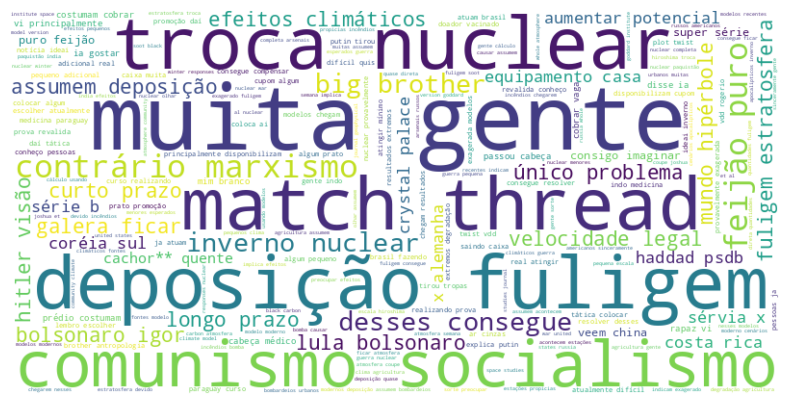

In [78]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neu_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

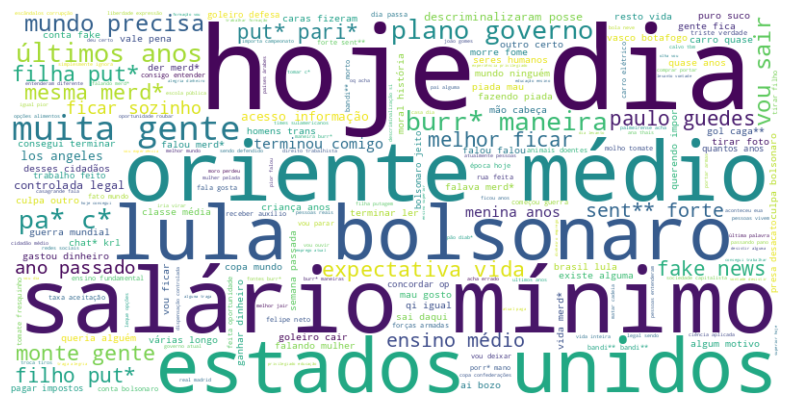

In [79]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neg_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


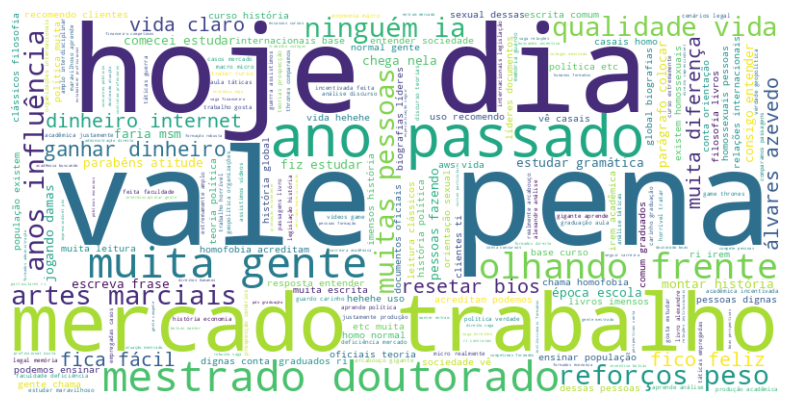

In [80]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(pos_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

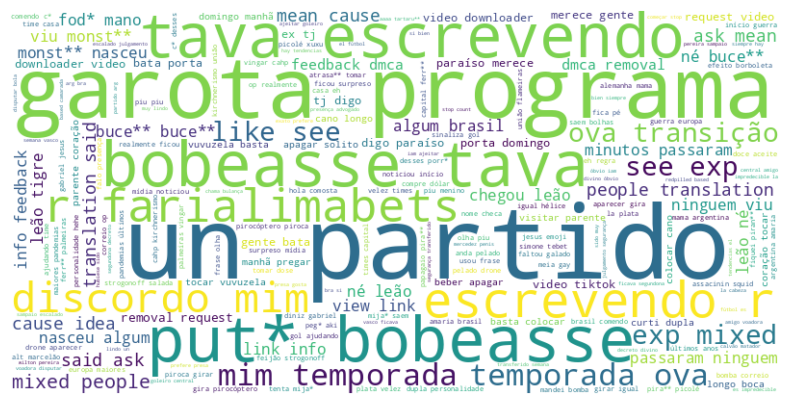

In [81]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(ns_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

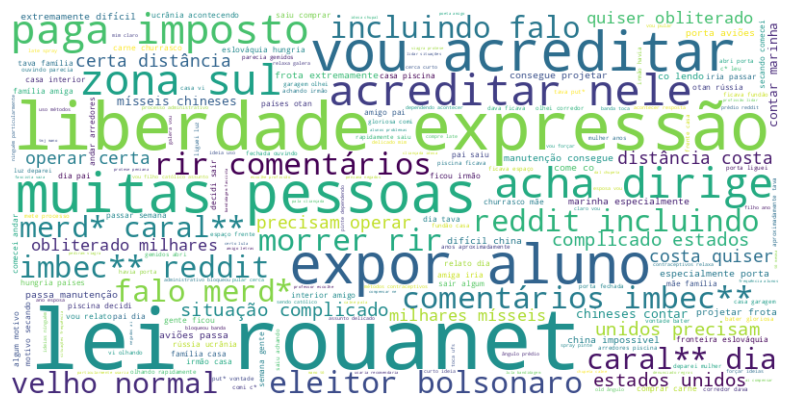

In [82]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(dis_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



#Nuvem 3-gramas(retirei as stop_words)

In [83]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]

ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

In [84]:
neutro_comments = neutro_comments.assign(cleaned_comment_v2=neutro_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
negativo_comments = negativo_comments.assign(cleaned_comment_v2=negativo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
positivo_comments = positivo_comments.assign(cleaned_comment_v2=positivo_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
ns_comments = ns_comments.assign(cleaned_comment_v2=ns_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))
dis_comments = dis_comments.assign(cleaned_comment_v2=dis_comments['Comentário'].apply(lambda c: clean_comment_v2(str(c))))

In [85]:
lista_neu = neutro_comments['cleaned_comment_v2'].tolist()
lista_neg = negativo_comments['cleaned_comment_v2'].tolist()
lista_pos = positivo_comments['cleaned_comment_v2'].tolist()
lista_ns = ns_comments['cleaned_comment_v2'].tolist()
lista_dis = dis_comments['cleaned_comment_v2'].tolist()

In [86]:
def extract_ngrams(comment_list, n):
    all_ngrams = []
    for comment in comment_list:
        tokens = ocultar_em_frase(comment.lower(), lista_palavroes)
        ngrams_list = list(nltk.ngrams(tokens, n))
        all_ngrams.extend(ngrams_list)
    return all_ngrams

In [87]:
neu_ngrams = extract_ngrams(lista_neu, 3)
neg_ngrams = extract_ngrams(lista_neg, 3)
pos_ngrams = extract_ngrams(lista_pos, 3)
ns_ngrams = extract_ngrams(lista_ns, 3)
dis_ngrams = extract_ngrams(lista_dis, 3)

In [88]:
neu_ngram_freq = Counter(neu_ngrams)
neg_ngram_freq = Counter(neg_ngrams)
pos_ngram_freq = Counter(pos_ngrams)
ns_ngram_freq = Counter(ns_ngrams)
dis_ngram_freq = Counter(dis_ngrams)

In [89]:
def converter_texto(counter_tipo):
    dic = {}
    lista_pontuacao = ['!','.', ',', ':', '>', '<', "'", '"', "%", "$", "@", "*", "?", "/", "+", "-", "(", ")", "()", "|", ";", "{}", "^", "~", "´", "`", "{", "}", "[", "]", "[]", "#", "&"]

    for key, value in counter_tipo.items():
      if key[0] not in lista_pontuacao and key[1] not in lista_pontuacao and key[2] not in lista_pontuacao:
        dic[f'{key[0]} {key[1]} {key[2]}'] = value
    return dic

In [90]:
neu_ngram_freq = converter_texto(neu_ngram_freq)
neg_ngram_freq = converter_texto(neg_ngram_freq)
pos_ngram_freq = converter_texto(pos_ngram_freq)
ns_ngram_freq = converter_texto(ns_ngram_freq)
dis_ngram_freq = converter_texto(dis_ngram_freq)

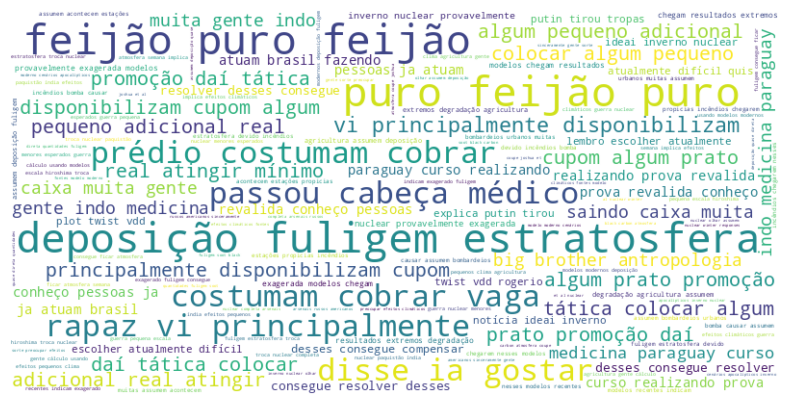

In [91]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neu_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

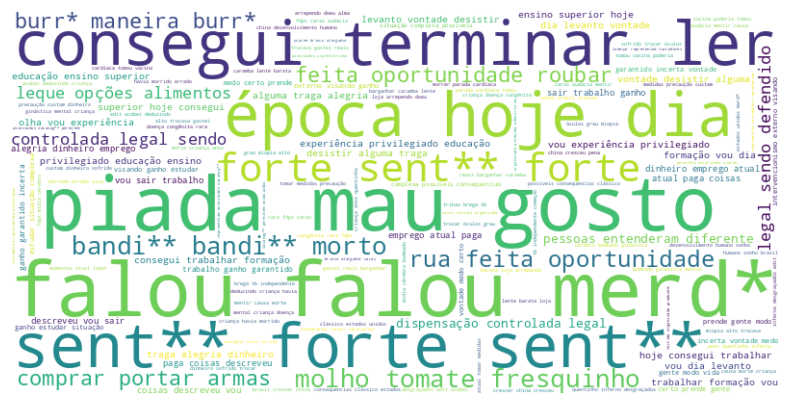

In [92]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(neg_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

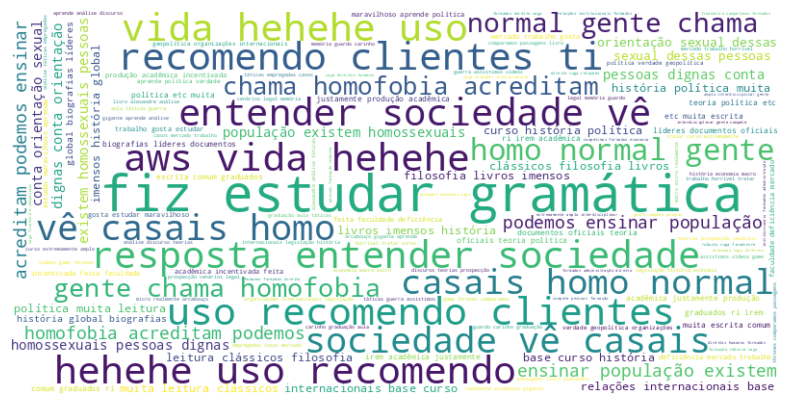

In [93]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(pos_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

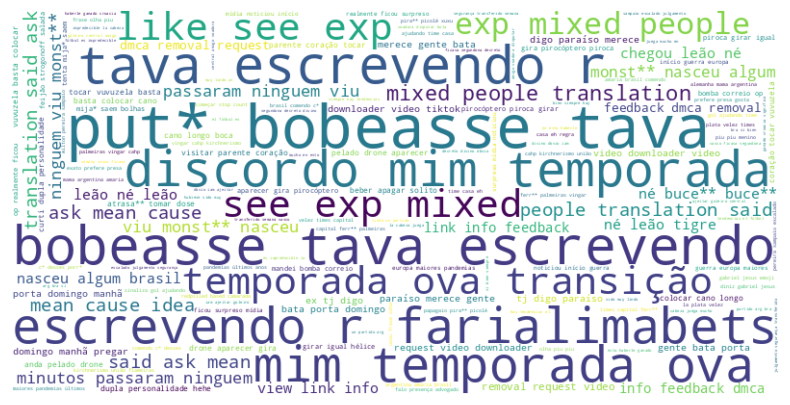

In [94]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(ns_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

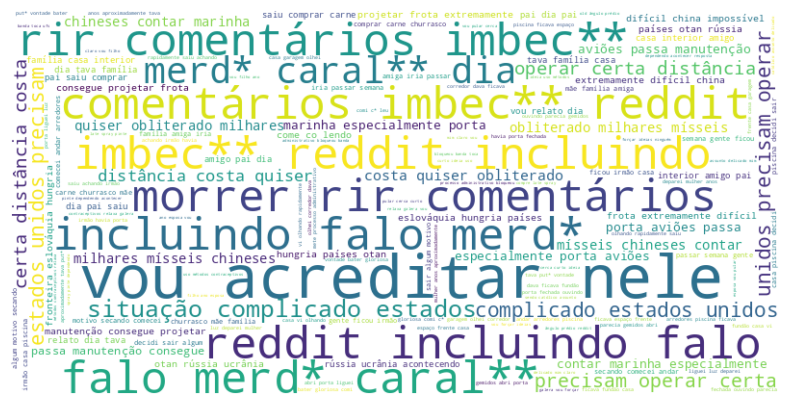

In [95]:
#discordncia total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(dis_ngram_freq))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

#Análise da quantidade de comentários estrangeiros nas rotulações

In [96]:
!pip install pyenchant

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 2.1 MB/s eta 0:00:00


In [97]:
!apt-get install -y libenchant-2-2

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  aspell aspell-en dictionaries-common enchant-2 hunspell-en-us libaspell15 libhunspell-1.7-0
  libtext-iconv-perl
Suggested packages:
  aspell-doc spellutils wordlist hunspell openoffice.org-hunspell | openoffice.org-core
  libenchant-2-voikko
The following NEW packages will be installed:
  aspell aspell-en dictionaries-common enchant-2 hunspell-en-us libaspell15 libenchant-2-2
  libhunspell-1.7-0 libtext-iconv-perl
0 upgraded, 9 newly installed, 0 to remove and 49 not upgraded.
Need to get 1,431 kB of archives.
After this operation, 5,501 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libtext-iconv-perl amd64 1.7-7build3 [14.3 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libaspell15 amd64 0.60.8-4build1 [325 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 dict

In [98]:
import enchant
english_dict = enchant.Dict("en_US")

In [99]:
from nltk.corpus import wordnet

In [100]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('words')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [101]:
!python -m spacy download pt_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 18.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [102]:
import spacy

# Carrega o modelo em português
nlp1 = spacy.load("pt_core_news_sm")
nlp2 = spacy.load('pt_core_news_lg')

In [103]:

lista_palavras_pt = []
with open("/content/drive/MyDrive/Colab Notebooks/IC/Russia/wordsList.txt", "r", encoding="ISO-8859-1") as arquivo:
    while True:
        linha = arquivo.readline()  # Lê uma linha por vez
        if not linha:
            break  # Sai do loop quando não há mais linhas para ler
        lista_palavras_pt.append(linha.lower().strip())  # `strip()` remove a quebra de linha no final

In [104]:


def texto_com_ingles_enchant(id, texto):

  lista_palavras = []

  for p in nltk.word_tokenize(texto.lower()):

    if len(p) == 1 or p in lista_palavras_pt or p.isdigit() == True:
      continue

    if bool(english_dict.check(p)) or bool(wordnet.synsets(p)):
      lista_palavras.append(p)

  if lista_palavras == []:
    return ''
  else:
    return {'id': id, 'palavras': lista_palavras}


In [105]:

lista_ids_enchant = []
a = 0
for i, l in comments_df.iterrows():
  lista_ids_enchant.append(texto_com_ingles_enchant(l['id'],l['Comentário']))


In [106]:
lista_ids_enchant = [x for x in lista_ids_enchant if x != '']

In [107]:
lista_final = lista_ids_enchant

In [108]:
len(lista_final)

552

In [109]:
df_f = pd.DataFrame(lista_final)

In [110]:
copia_df = comments_df.copy()

In [111]:
merge = pd.merge(df_f, copia_df, on='id', how='inner')

In [112]:
merge = merge[['id', 'Comentário', 'palavras']]

In [113]:
merge = merge.drop_duplicates(subset=['id'])
merge

,id,Comentário,palavras
0,hrs3n3y,"Putz, se bobeasse tava escrevendo isso no r/fa...",[putz]
1,hshrlwk,Raw (2016),[raw]
2,ht3dm01,Big Brother é antropologia.,"[big, brother]"
3,ht9my53,Relações Internacionais.\n\nA base do curso é ...,"[of, thrones]"
4,htinz29,Esses fdps da mídia devem estar com o cérebro ...,[edit]
...,...,...,...
547,izoefcj,> Não poder se casar com uma menor de 16 anos ...,[pros]
548,j05yw0u,"Primeiro, isso não é texto.\n\nSegundo, tu sim...","[comic, comic]"
549,j10f8g2,*arranca por la izquierda* el genio de la poli...,[el]
550,j1rpqpg,"O exército vermelho era foda, pai! Os Snipers ...",[snipers]


In [114]:
len(merge)

552

In [115]:
lista_n_ingles = ['ha','bi','bah','austria','curitiba','ess', 'heteros','ne','musk', 'pl','trans', 'sus','20s','fresno','russia','gov','tesla','hiroshima','ea','flu','voces','qs', 'qi','labia', 'pm','tibia','ru','mins','dj','mackenzie','echo','radios','dale','penis','band','minima','leo','sera','viagra', 'ne','lm','ain','cfc','johnson','minion', 'minions','un','sc','dm','excel','mds','pix','gospel','isis','ne','min','pikas','nissan','zap','politico', 'politicos','russia','karma','var','dal','saida','bozo','amazon','disney','paraguay','puts', 'putz', 'kkk', 'putin', 'so', 'sus', 'co', 'pita', 'rs', 'mt', 'gratis', 'poem', 'colombia', 'po', 'inter', 'corinthians', 'pros', 'lek', 'br', 'qi', 'gospel', 'pm', 'bhs', 'dps', 'pes', 'video', 'doc', 'cancer', 'alt', 'rh', 'ess', 'lee', 'dms', 'mts', 'aa', 'va', 'pa', 'cassinos', 'leo', 'camera', 'involve', 'vies', 'brasilia', 'mes', 'pros', 'po', 'telegram', 'instagram', 'twitter', 'tinder', 'minima', 'curitiba', 'dps', 'trump', 'min', 'vices', 'ebola', 'india', 'overdose', 'berlin', 'sera', 'ney', 'voces', 'obs', 'aids', 'ain', 'gades', 'tebet', 'gracie', 'lingua', 'lenin', 'arthur', 'mt', 'mongolia', 'italia', 'av', 'ki', 'kayo', 'nd', 'maraca', 'trial', 'georgia', 'ajax', 'tottenham', 'macumba', 'soh', 'dps', 'dms', 'poe', 'california', 'twitter', 'ananias', 'el']

In [116]:
ids_n_real_ingles = []

for i, l in merge.iterrows():
  lt = []
  for p in l['palavras']:
    if p in lista_n_ingles:
      lt.append(p)
  if len(lt) == len(l['palavras']):
    ids_n_real_ingles.append(l['id'])

In [117]:
len(ids_n_real_ingles)

202

In [118]:
resultado = merge[merge['id'].isin(ids_n_real_ingles) == False]

In [119]:
resultado = resultado[['id', 'palavras']]

In [120]:
result = pd.merge(resultado, comments_df, on='id', how='inner')

In [121]:
result_neu = result[result['class_result'] == 0]
result_neg = result[result['class_result'] == -1]
result_pos = result[result['class_result'] == 1]
result_ns = result[result['class_result'] == 10]
result_dis = result[result['class_result'] == -10]


result_ns = result_ns[result_ns["id"] != "hwns0af"]

In [122]:
valores = [len(result_neu), len(result_neg), len(result_pos)]

In [123]:
categorias = ['neutro', 'negativo', 'positivo']

Text(0, 0.5, 'Quantidade')

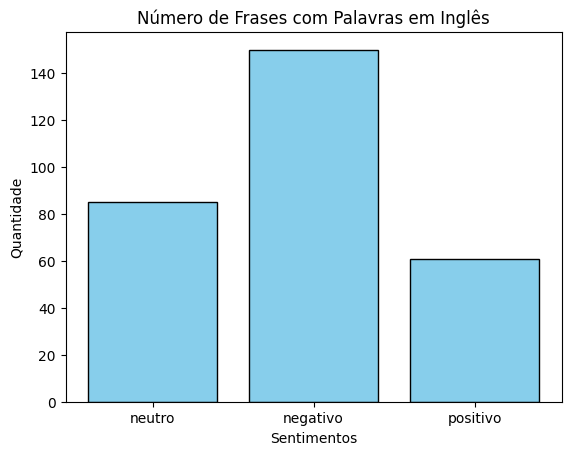

In [124]:
plt.bar(categorias, valores, color='skyblue', edgecolor='black')

# Adicionar título e rótulos
plt.title('Número de Frases com Palavras em Inglês')
plt.xlabel('Sentimentos')
plt.ylabel('Quantidade')

In [125]:
neutro_comments = comments_df[comments_df['class_result'] == 0]
negativo_comments = comments_df[comments_df['class_result'] == -1]
positivo_comments = comments_df[comments_df['class_result'] == 1]
ns_comments = comments_df[comments_df['class_result'] == 10]
dis_comments = comments_df[comments_df['class_result'] == -10]

ns_comments = ns_comments[ns_comments["id"] != "hwns0af"] #retirar comentário em alemão

In [126]:
len(result_neu)/len(neutro_comments) * 100, len(result_neg)/len(negativo_comments)* 100 , len(result_pos)/len(positivo_comments) * 100, len(result_ns)/len(ns_comments) * 100,  len(result_dis)/len(dis_comments) * 100

(20.286396181384248,
 15.608740894901144,
 18.711656441717793,
 21.951219512195124,
 16.587677725118482)

In [127]:
def contar_ingles(df):

  contagem = Counter()

  for i, l in df.iterrows():

    for p in l['palavras']:
      if p not in lista_n_ingles:
        contagem[p] += 1
  return contagem

In [128]:
counter_neu = contar_ingles(result_neu)
counter_neg = contar_ingles(result_neg)
counter_pos =contar_ingles(result_pos)
counter_ns =contar_ingles(result_ns)
counter_dis =contar_ingles(result_dis)

In [129]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

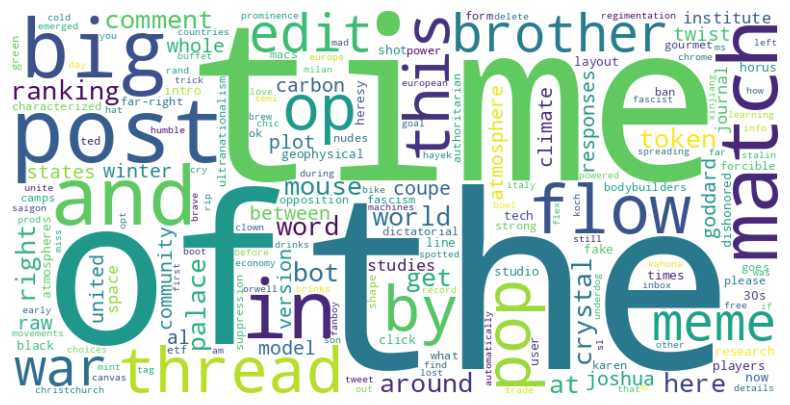

In [130]:
#neutros
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(counter_neu))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

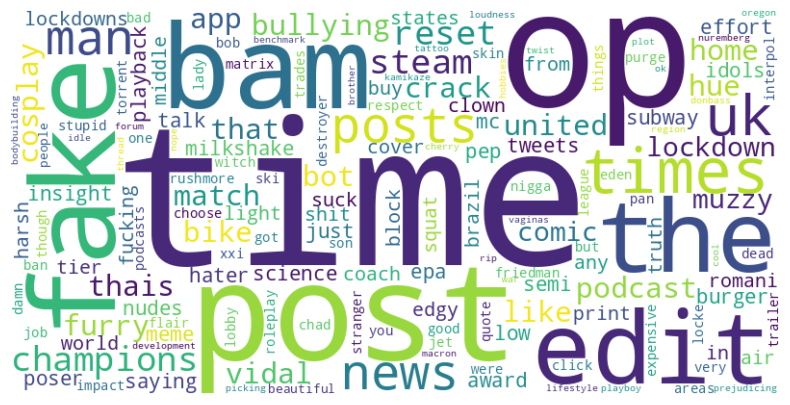

In [131]:
#negativos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(counter_neg))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

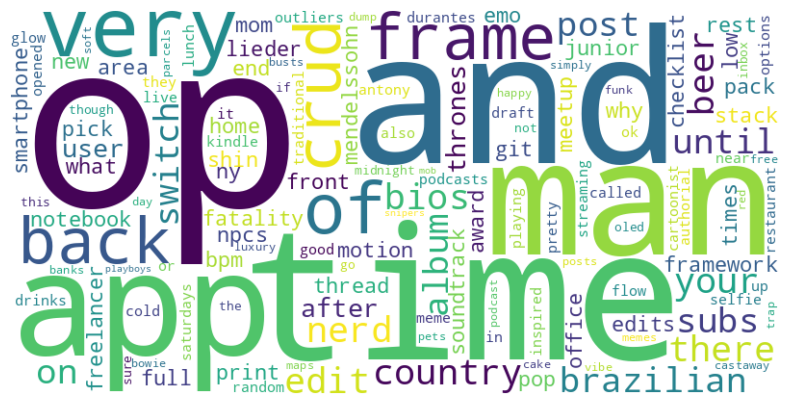

In [132]:
#positivos
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(counter_pos))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

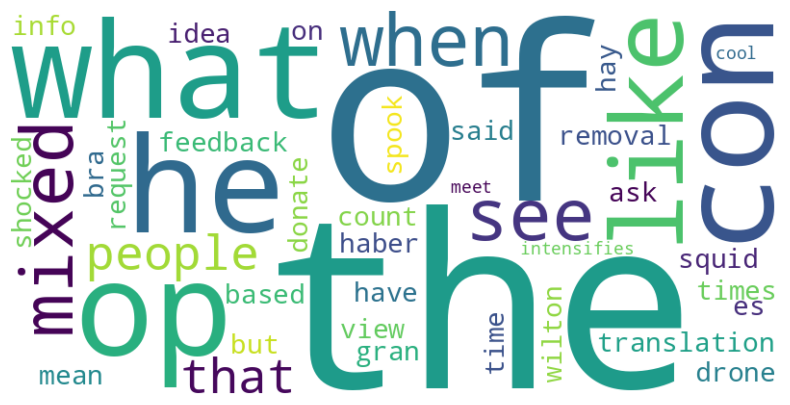

In [133]:
#não sei dizer
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(counter_ns))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

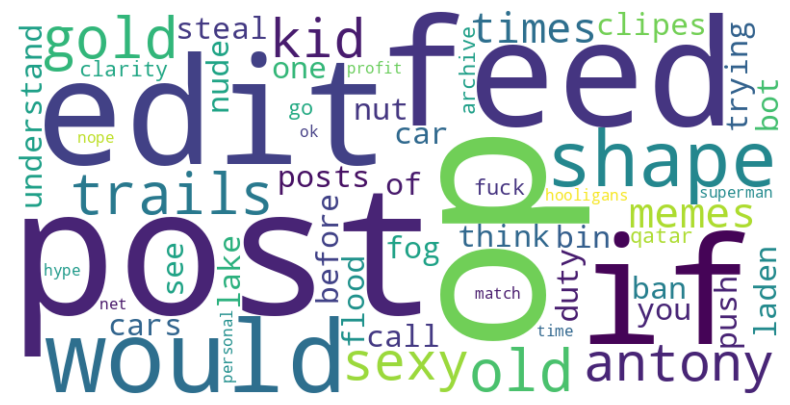

In [134]:
#discordância total
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(counter_dis))

# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()